In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Unzip Dataset

In [7]:
!unzip /content/drive/MyDrive/AffectNet-8Labels.zip

Archive:  /content/drive/MyDrive/AffectNet-8Labels.zip
 extracting: AffectNet8Labels_Documentation_OneDrive_March2021.pdf  
 extracting: train_set.tar           
 extracting: val_set.tar             


In [8]:
!tar -xvf train_set.tar

Streaming output truncated to the last 5000 lines.
train_set/annotations/392066_lnd.npy
train_set/annotations/83536_lnd.npy
train_set/annotations/26361_lnd.npy
train_set/annotations/313969_aro.npy
train_set/annotations/286825_exp.npy
train_set/annotations/392215_aro.npy
train_set/annotations/330087_lnd.npy
train_set/annotations/110001_val.npy
train_set/annotations/371482_aro.npy
train_set/annotations/27940_aro.npy
train_set/annotations/35729_exp.npy
train_set/annotations/156731_aro.npy
train_set/annotations/145081_aro.npy
train_set/annotations/93043_exp.npy
train_set/annotations/279607_lnd.npy
train_set/annotations/48472_lnd.npy
train_set/annotations/206512_exp.npy
train_set/annotations/84264_aro.npy
train_set/annotations/187769_lnd.npy
train_set/annotations/300707_exp.npy
train_set/annotations/123766_exp.npy
train_set/annotations/173216_aro.npy
train_set/annotations/262096_lnd.npy
train_set/annotations/194946_aro.npy
train_set/annotations/411301_aro.npy
train_set/annotations/43103_aro

In [9]:
!tar -xvf val_set.tar

Streaming output truncated to the last 5000 lines.
val_set/annotations/678_lnd.npy
val_set/annotations/1526_lnd.npy
val_set/annotations/5420_aro.npy
val_set/annotations/4628_exp.npy
val_set/annotations/5254_lnd.npy
val_set/annotations/4769_aro.npy
val_set/annotations/1994_lnd.npy
val_set/annotations/4840_lnd.npy
val_set/annotations/3546_val.npy
val_set/annotations/2606_lnd.npy
val_set/annotations/1282_val.npy
val_set/annotations/948_lnd.npy
val_set/annotations/2672_lnd.npy
val_set/annotations/1599_aro.npy
val_set/annotations/2177_exp.npy
val_set/annotations/1830_val.npy
val_set/annotations/4676_aro.npy
val_set/annotations/3228_aro.npy
val_set/annotations/5196_aro.npy
val_set/annotations/714_val.npy
val_set/annotations/2296_exp.npy
val_set/annotations/934_lnd.npy
val_set/annotations/1511_val.npy
val_set/annotations/2923_exp.npy
val_set/annotations/4198_aro.npy
val_set/annotations/886_lnd.npy
val_set/annotations/1924_exp.npy
val_set/annotations/1462_lnd.npy
val_set/annotations/812_exp.np

# Data Counts

In [10]:
import glob
train_data_path = glob.glob('./train_set/images/*')

In [11]:
print(len(train_data_path))

287651


In [12]:
val_data_path = glob.glob('./val_set/images/*')
print(len(val_data_path))

3999


# Show Data Sample

In [13]:
img = cv2.imread('./train_set/images/0.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

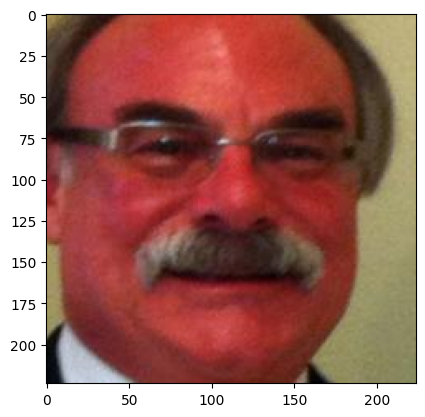

In [14]:
plt.imshow(img)

In [15]:
annotations = glob.glob('./train_set/annotations/*')

In [16]:
print(len(annotations))

1150604


In [17]:
labels = {
     0: 'Neutral',
     1: 'Happy',
     2: 'Sad',
     3: 'Surprise',
     4: 'Fear',
     5: 'Disgust',
     6: 'Anger',
     7: 'Contempt'
}

In [18]:
annotations[0]

'./train_set/annotations/380709_lnd.npy'

In [19]:
label = np.load('./train_set/annotations/0_exp.npy')

In [20]:
print(label)

1


In [21]:
print(labels[int(label)])

Happy


Text(0.5, 1.0, 'Happy')

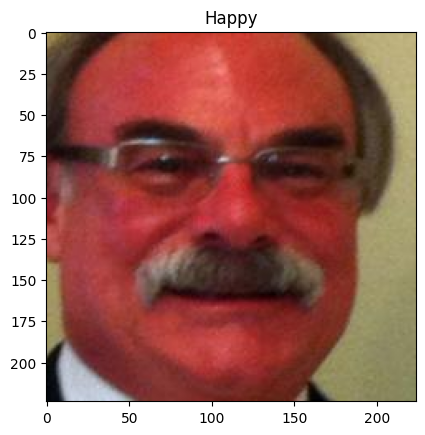

In [22]:
image_name = '0'
img = cv2.imread(f'./train_set/images/{image_name}.jpg')
label = np.load(f'./train_set/annotations/{image_name}_exp.npy')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title(labels[int(label)])

Text(0.5, 1.0, 'Neutral')

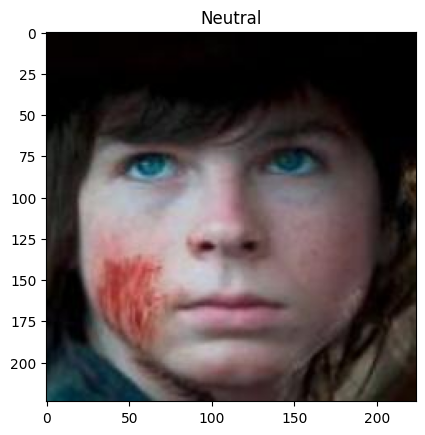

In [23]:
image_name = '1'
img = cv2.imread(f'./train_set/images/{image_name}.jpg')
label = np.load(f'./train_set/annotations/{image_name}_exp.npy')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title(labels[int(label)])

Text(0.5, 1.0, 'Neutral')

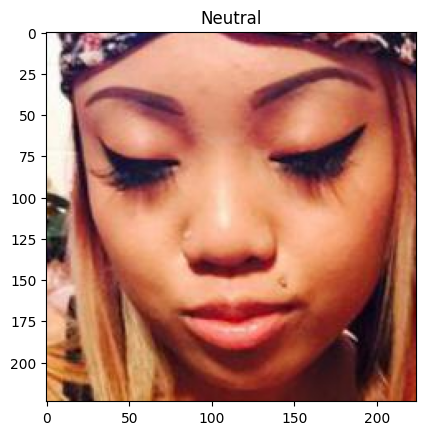

In [24]:
image_name = '2'
img = cv2.imread(f'./train_set/images/{image_name}.jpg')
label = np.load(f'./train_set/annotations/{image_name}_exp.npy')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title(labels[int(label)])

Text(0.5, 1.0, 'Anger')

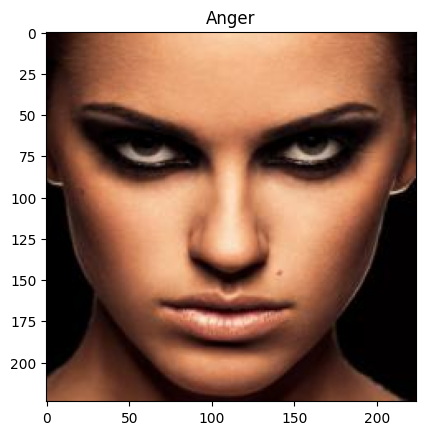

In [25]:
image_name = '348274'
img = cv2.imread(f'./train_set/images/{image_name}.jpg')
label = np.load(f'./train_set/annotations/{image_name}_exp.npy')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)
plt.title(labels[int(label)])

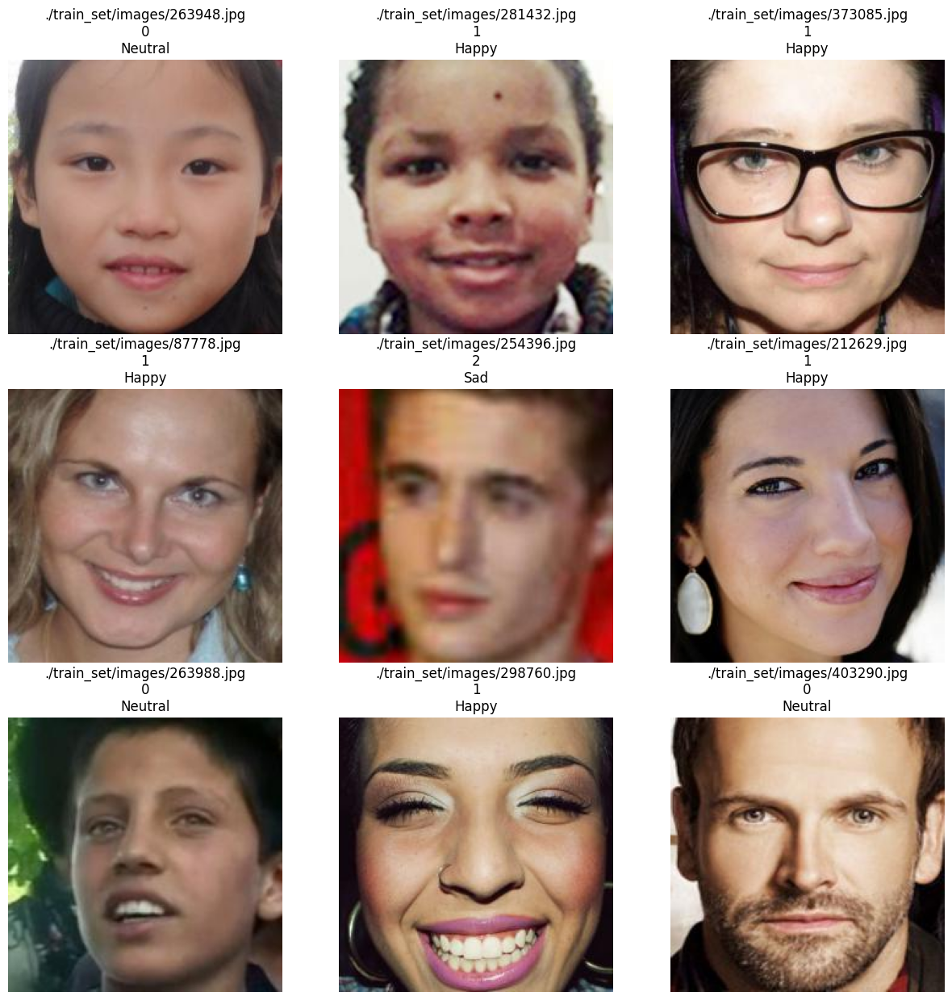

In [26]:
plt.subplots(nrows = 3, ncols = 3, figsize = (15, 15))

for i, imgIndex in enumerate(np.random.choice(train_data_path, size = 9)):
  id = imgIndex.split('/')[-1].split('.')[0]
  plt.subplot(3, 3, i + 1)
  plt.axis(False)
  plt.grid(False)
  plt.title(f'{imgIndex}\n{np.load(f"./train_set/annotations/{id}_exp.npy")}\n{labels[int(np.load(f"./train_set/annotations/{id}_exp.npy"))]}')
  plt.imshow(cv2.cvtColor(cv2.imread(imgIndex), cv2.COLOR_BGR2RGB))
plt.show()

# Folder data based on labels (Trains)

In [27]:
import glob
from tqdm import tqdm
train_data_path = glob.glob('./train_set/images/*')

In [28]:
train_images_path = []
train_labels = []
for i in tqdm(range(len(train_data_path))):
  train_images_path.append(train_data_path[i])
  train_labels.append(int(np.load(f'./train_set/annotations/{train_data_path[i].split("/")[-1].split(".")[0]}_exp.npy')))

100%|██████████| 287651/287651 [02:13<00:00, 2152.88it/s]


In [29]:
id2label = {
     0: 'Neutral',
     1: 'Happy',
     2: 'Sad',
     3: 'Surprise',
     4: 'Fear',
     5: 'Disgust',
     6: 'Anger',
     7: 'Contempt'
}

label2id = {
     'Neutral': 0,
     'Happy': 1,
     'Sad': 2,
     'Surprise': 3,
     'Fear': 4,
     'Disgust': 5,
     'Anger': 6,
     'Contempt': 7
}

In [30]:
import os
if not os.path.exists('train_data'):
  os.mkdir('train_data')
  for dir_name in tqdm(label2id):
    os.mkdir('train_data/'+dir_name)

100%|██████████| 8/8 [00:00<00:00, 15462.87it/s]


In [31]:
# Move data shutil.move(source, destination)
import shutil
for path, label in tqdm(zip(train_images_path, train_labels)):
  shutil.move(path, 'train_data/'+id2label[label])

287651it [00:19, 14500.83it/s]


Text(0.5, 1.0, 'Class Distributions')

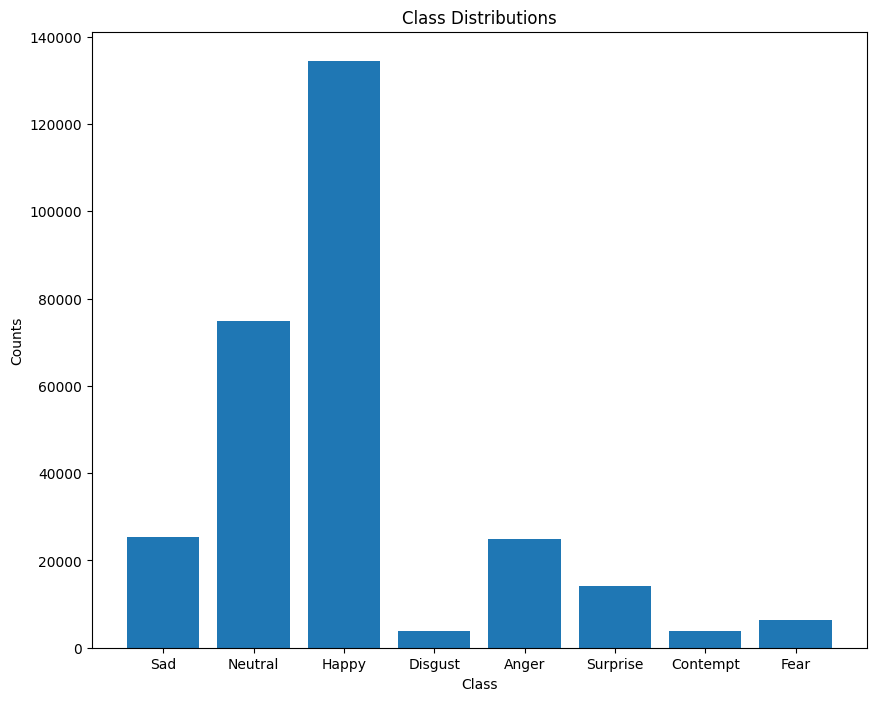

In [32]:
import collections
label_distributsion = collections.Counter(train_labels)
keys = []
for i in label_distributsion.keys():
  keys.append(id2label[i])
plt.figure(figsize=(10,8))
plt.bar(keys, label_distributsion.values())
plt.xlabel('Class')
plt.ylabel('Counts')
plt.title('Class Distributions')

In [33]:
label_distributsion

Counter({2: 25459,
         0: 74874,
         1: 134415,
         5: 3803,
         6: 24882,
         3: 14090,
         7: 3750,
         4: 6378})

In [47]:
!mkdir train_set_balance
!cp -r train_data/* train_set_balance

In [48]:
!mkdir train_set_balance/others
!mv train_set_balance/Disgust/* train_set_balance/others/
!mv train_set_balance/Surprise/* train_set_balance/others/
!mv train_set_balance/Contempt/* train_set_balance/others/
!mv train_set_balance/Fear/* train_set_balance/others/

In [49]:
!rm -r train_set_balance/Disgust
!rm -r train_set_balance/Surprise
!rm -r train_set_balance/Contempt
!rm -r train_set_balance/Fear

# Folder data based on labels (Validations)

In [37]:
import glob
from tqdm import tqdm
val_data_path = glob.glob('./val_set/images/*')

In [38]:
val_images_path = []
val_labels = []
for i in tqdm(range(len(val_data_path))):
  val_images_path.append(val_data_path[i])
  val_labels.append(int(np.load(f'./val_set/annotations/{val_data_path[i].split("/")[-1].split(".")[0]}_exp.npy')))

100%|██████████| 3999/3999 [00:00<00:00, 7312.82it/s]


In [39]:
import os
if not os.path.exists('val_data'):
  os.mkdir('val_data')
  for dir_name in tqdm(label2id):
    os.mkdir('val_data/'+dir_name)

100%|██████████| 8/8 [00:00<00:00, 9000.65it/s]


In [40]:
# Move data shutil.move(source, destination)
import shutil
for path, label in tqdm(zip(val_images_path, val_labels)):
  shutil.move(path, 'val_data/'+id2label[label])

3999it [00:00, 15343.26it/s]


Text(0.5, 1.0, 'Class Distributions')

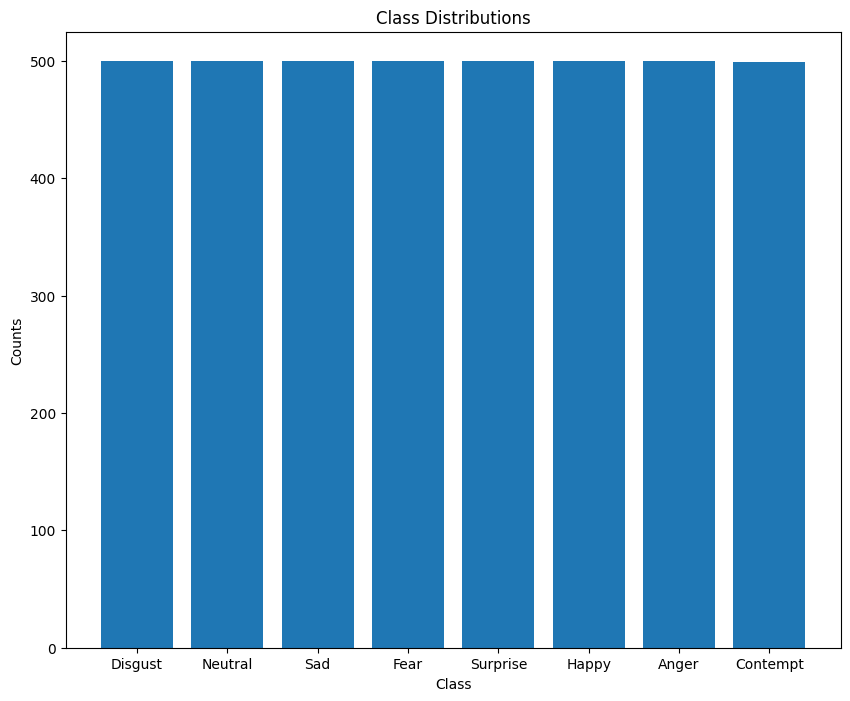

In [41]:
import collections
label_distributsion = collections.Counter(val_labels)
keys = []
for i in label_distributsion.keys():
  keys.append(id2label[i])
plt.figure(figsize=(10,8))
plt.bar(keys, label_distributsion.values())
plt.xlabel('Class')
plt.ylabel('Counts')
plt.title('Class Distributions')

In [50]:
!mkdir valid_set_balance
!cp -r val_data/* valid_set_balance

In [51]:
!mkdir valid_set_balance/others
!mv valid_set_balance/Disgust/* valid_set_balance/others/
!mv valid_set_balance/Surprise/* valid_set_balance/others/
!mv valid_set_balance/Contempt/* valid_set_balance/others/
!mv valid_set_balance/Fear/* valid_set_balance/others/

In [52]:
!rm -r valid_set_balance/Disgust
!rm -r valid_set_balance/Surprise
!rm -r valid_set_balance/Contempt
!rm -r valid_set_balance/Fear

## Importing Libraries

In [53]:
# Libraries
import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
from tensorflow.keras.preprocessing import image_dataset_from_directory
from keras.preprocessing import image
import glob
import os
import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import Sequential
from keras.models import  model_from_json
from tensorflow.keras.utils import plot_model
from tensorflow.keras.regularizers import L2
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense,LeakyReLU, BatchNormalization, ReLU

## **Train, Test preparation**

### Image Data Generator for training data using Image augmentation

In [54]:
train_gen = image.ImageDataGenerator(rescale = 1./255,
                               rotation_range = 30,
                               width_shift_range = 0.1,
                               height_shift_range = 0.1,
                               shear_range = 0.1,
                               zoom_range = 0.1,
                               horizontal_flip = True,
                               fill_mode = 'nearest',
                                     validation_split=0.1)

train_data = train_gen.flow_from_directory(directory= 'train_set_balance/',
                                              target_size=(224,224),
                                              class_mode='categorical',
                                              batch_size=16,
                                              subset='training'
                                             )
len(train_data)

Found 258888 images belonging to 5 classes.


16181

### Image Data Generator for validation data

In [55]:
val_data = train_gen.flow_from_directory(directory= 'train_set_balance/',
                                              target_size=(224,224),
                                              class_mode='categorical',
                                              batch_size=10,
                                              subset='validation'
                                             )
len(val_data)

Found 28763 images belonging to 5 classes.


2877

### Image Data Generator for Test data


In [56]:
test_gen = image.ImageDataGenerator(rescale = 1./255)
test_data = test_gen.flow_from_directory(directory= 'valid_set_balance/',
                                                   target_size=(224,224),
                                                   class_mode='categorical',
                                                   batch_size=10                                                   )
len(test_data)

Found 3999 images belonging to 5 classes.


400

## Sample images from generators

In [57]:
def plot_generator_images(gen, suptitle, labelDecDict, print_pred = False, model = None, nrows = 3, ncols = 3, figsize = (12, 12)):
    gen_data = gen.next()

    plt.subplots(nrows = nrows, ncols = ncols, figsize = figsize)
    plt.suptitle(suptitle, fontsize = 20)
    plt.tight_layout(rect = [0, 0, 1, 0.96], h_pad = 2)

    if(print_pred and model):
        pred = np.argmax(model.predict(gen_data[0]), axis=1)

    for i in range(nrows * ncols):
        plt.subplot(nrows, ncols, i + 1)
        plt.axis(False)
        plt.grid(False)

        if(print_pred and pred.any()):
            plt.title(f"True: {labelDecDict[np.argmax(gen_data[1][i])]}\nPredicted: {labelDecDict[np.argmax(pred[i])]}")
        else:
            plt.title(labelDecDict[np.argmax(gen_data[1][i])])
        plt.imshow(gen_data[0][i])

Training Samples

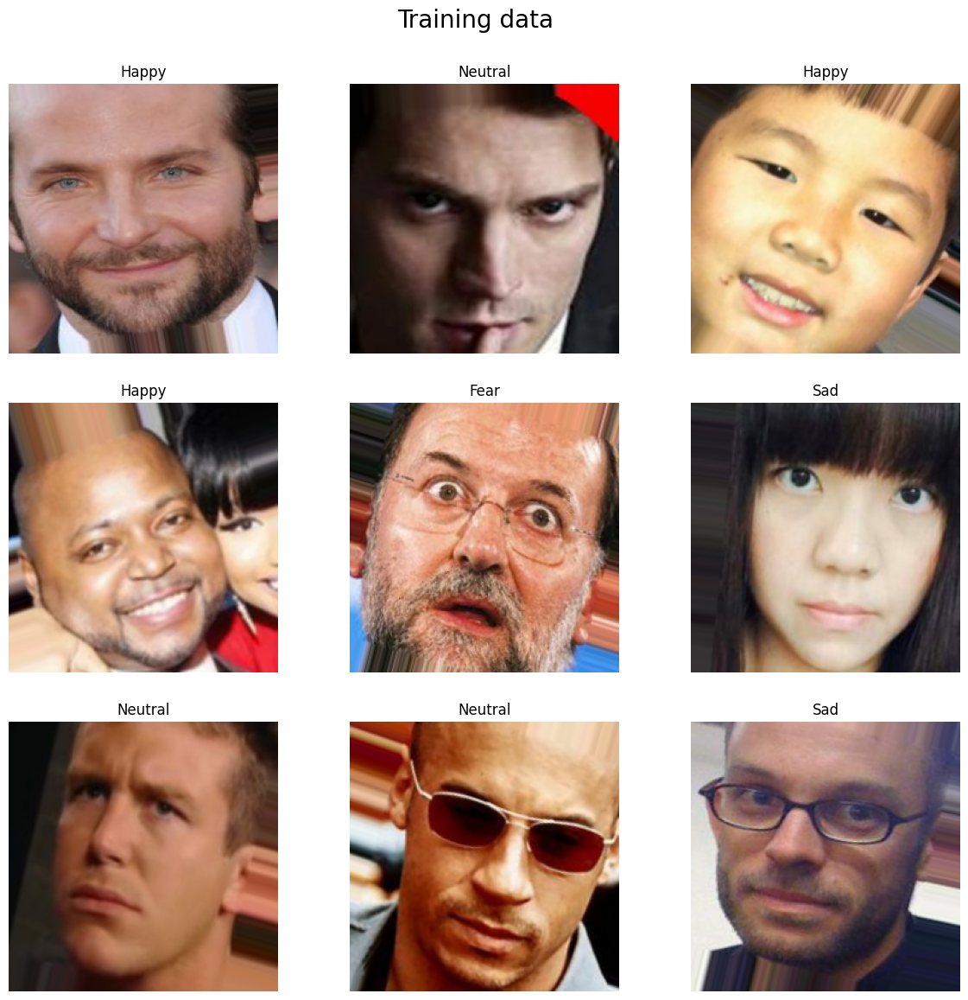

In [58]:
plot_generator_images(train_data, "Training data", id2label)

validation Samples

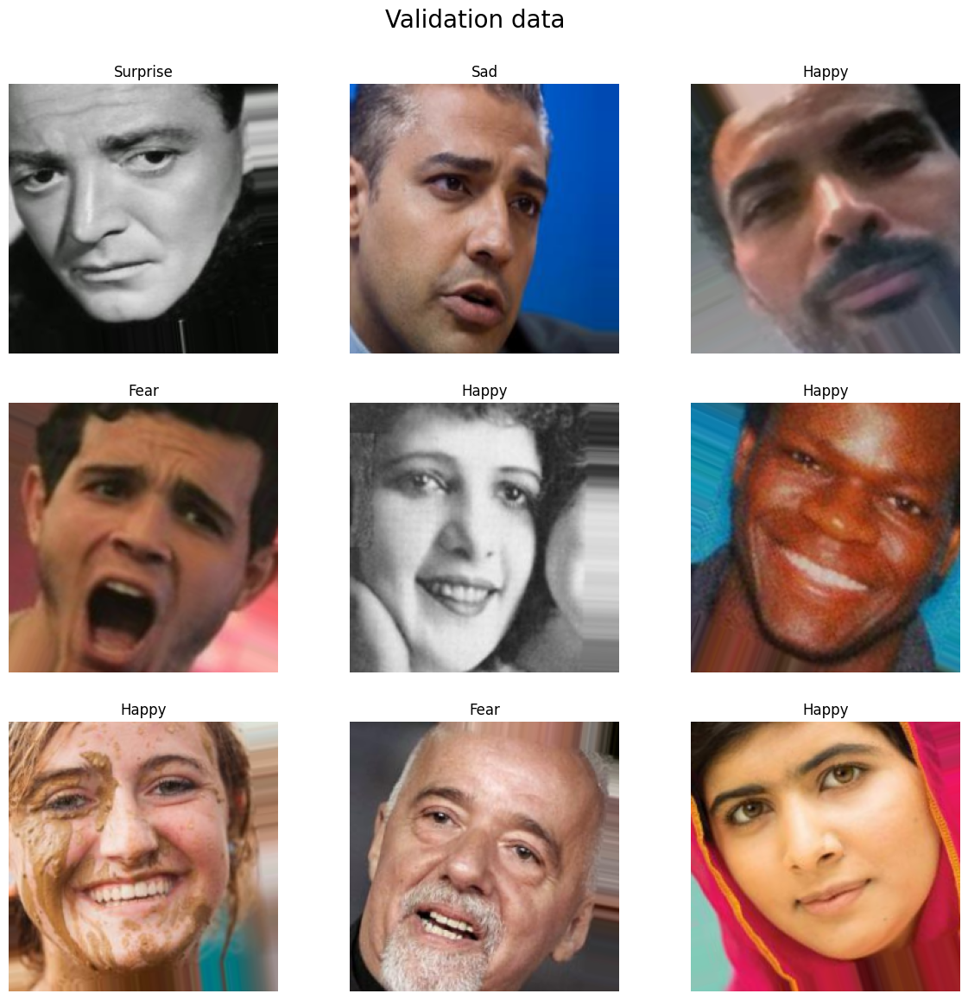

In [59]:
plot_generator_images(val_data, "Validation data", id2label)

# **CNN Model**

## **Model Creation**

In [ ]:
model = Sequential([
    Conv2D(32, 5, padding = 'same', input_shape = ((224,224,3))),
    Conv2D(32, 5, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    Conv2D(32, 4, padding = 'same'),
    Conv2D(32, 4, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),

    Conv2D(64, 4, padding = 'same'),
    Conv2D(64, 4, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    BatchNormalization(),


    Conv2D(128, 3, padding = 'same'),
    Conv2D(128, 3, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),
    Conv2D(128, 2, padding = 'same'),
    Conv2D(128, 2, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),

    Conv2D(256, 2, padding = 'same'),
    Conv2D(256, 2, padding = 'same', activation = LeakyReLU(alpha = 0.5)),
    MaxPooling2D(),

    Flatten(),
    BatchNormalization(),
    Dropout(0.2),
    Dense(512, activation = 'sigmoid'),
    Dropout(0.2),
    Dense(256, activation = 'sigmoid'),
    Dropout(0.1),
    Dense(5, activation = 'softmax')
])

LEARNING_RATE = 0.0001
model.compile(optimizer = Adam(LEARNING_RATE),
              loss = 'categorical_crossentropy',
              metrics = ['accuracy'])

model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 224, 224, 32)      2432      
                                                                 
 conv2d_13 (Conv2D)          (None, 224, 224, 32)      25632     
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 112, 112, 32)      16416     
                                                                 
 conv2d_15 (Conv2D)          (None, 112, 112, 32)      16416     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 56, 56, 32)        0         
 g2D)                                                 

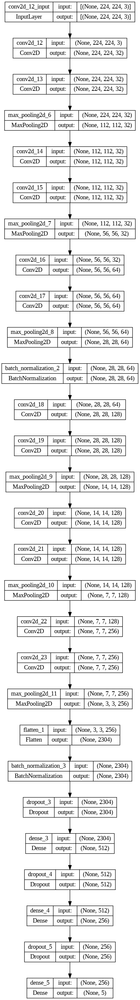

In [ ]:
from tensorflow.keras import utils
utils.plot_model(model, show_shapes=True)

In [ ]:
# run model
history = model.fit(
    train_data,
    validation_data= val_data,
    epochs=3
)

Epoch 1/3
16181/16181 [==============================] - 4857s 299ms/step - loss: 0.9647 - accuracy: 0.6338 - val_loss: 0.8103 - val_accuracy: 0.6976
Epoch 2/3
15536/16181 [===========================>..] - ETA: 2:59 - loss: 0.8231 - accuracy: 0.6923

In [ ]:
print(history.history.keys())
# summarize history for accuracy
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.figure()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


### **Model Evalution**

In [ ]:
test_loss, test_acc = model.evaluate(test_data, verbose = 0)

print(f"Loss on Testing data: {test_loss}")
print(f"Accuracy on Testing data: {test_acc}")

### **Plotting Test Results**

In [ ]:
plot_generator_images(test_data, "Testing data", id2label, print_pred = True, model = model)

## **Saving Model**

In [ ]:
model.save('./cnn_base.hd5')

# **Load Saved Model**

In [ ]:
saved_model = tf.keras.models.load_model('./cnn_base.hd5')

sm_test_loss, sm_test_acc = saved_model.evaluate(test_data, verbose = 0)

print(f"Loss on Testing data: {sm_test_loss}")
print(f"Accuracy on Testing data: {sm_test_acc}")

# Evaluation
### It's time to see how the model can predict unseen data. Therefore, the following section compares the actual label of each image with the predicted label.

In [ ]:
# The model performace chaching

X_test, y_test = next(test_data)
y_proba = model.predict(X_test)
for i in range(len(y_proba)):
    classFinal = y_proba[i].argmax()
    print(f'Predicted Class: {id2label[classFinal]}')
    print(f'Correct Class : {id2label[y_test[i].argmax()]}')
    plt.imshow(X_test[i])
    plt.show()
  #  break

In [93]:
# Store the data in X_train, y_train variables by iterating over the batches

import numpy
from tqdm import tqdm
test_data.reset()
X_test,y_test = next(test_data)
for i in tqdm(range(0,(numpy.math.ceil(test_data.samples / test_data.batch_size)-1))):
  img, label = next(test_data)
  X_test = np.append(X_test, img, axis=0 )
  y_test = np.append(y_test, label, axis=0)
print(X_test.shape, y_test.shape)



<ipython-input-93-e48ebc61f6ef>:7: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  for i in tqdm(range(0,(numpy.math.ceil(test_data.samples / test_data.batch_size)-1))):
 39%|███▉      | 156/399 [01:26<02:14,  1.81it/s]


KeyboardInterrupt: 

In [ ]:
# Calculate (Precision,Recall,F1-score) for each category

from sklearn.metrics import confusion_matrix,classification_report
import numpy

test_steps_per_epoch = numpy.math.ceil(test_data.samples / test_data.batch_size)

#predictions = model.predict_generator(validation_generator, steps=test_steps_per_epoch)
predictions = model.predict(X_test)
# Get most likely class
predicted_classes = numpy.argmax(predictions, axis=1)

true_classes = numpy.argmax(y_test, axis=1)
class_labels = list(test_data.class_indices.keys())

report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

### From the previous table and confusion matrix (in the next section), It can be understood that model is struggling with predicting animals with similar features. For example, american_bulldog and staffordshire_bull_terrier have many familiar elements that toughen decision-making even for humans.

In [62]:
# compute the confusion matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(20,20))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=80)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                  horizontalalignment="center",
                  color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label',color='blue')
    plt.xlabel('Predicted label',color='blue')

In [ ]:
confusion_mtx = confusion_matrix(true_classes, predicted_classes)

# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = class_labels, title="Confusion matrix")


# Pretrained Models

In [63]:
import pandas as pd
import numpy as np
import os
import tensorflow as tf
from tensorflow.keras.layers import Flatten,Dense,Dropout,BatchNormalization
from tensorflow.keras.models import Model,Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import PReLU
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.callbacks import ReduceLROnPlateau

In [76]:
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image
import os
import glob
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Dense, Dropout, Flatten, BatchNormalization, Conv2D, MaxPooling2D, Lambda, Input
from tensorflow.keras.applications import DenseNet121,VGG16,VGG19,ResNet50,ResNet152V2
from tensorflow.keras.applications.densenet import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.datasets import mnist
from tensorflow import keras
import numpy
from tensorflow.keras.initializers import HeUniform, VarianceScaling
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, f1_score, recall_score,classification_report, auc, roc_curve

In [77]:
models = ['Conv','MobileNet','VGGNet', 'ResNet','DenseNet','EfficientNet','InceptionNet']
results = {}

for model in models:
  results[model] = {'Accuracy':0, 'Precision':0, 'Recall':0, 'F1-Score':0, 'AUC':0}

In [98]:
# To clear the session before every run
tf.keras.backend.clear_session()

def TransferLearning(model_,
                     train_data,
                     val_data,
                      model_name,
                      img_size=(224,224),
                      trainable=True,
                      dropout_rate = 0.5,
                      no_layers_trainable = 5,
                     num_classes=5,
                      optimizer=tf.keras.optimizers.Adam()):


    model_.trainable = trainable
    for layer in model_.layers[:no_layers_trainable]:   layer.trainable = False

    model =tf.keras.Sequential()
    model.add(model_)
    # model.add(tf.keras.layers.GlobalAveragePooling2D())
    model.add(tf.keras.layers.Flatten())
    model.add(Dense(128, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))
    model.add(Dense(64, activation='relu'))
    model.add(BatchNormalization())
    model.add(Dense(num_classes, activation='softmax'))
    model.summary()

    #Compiling the model (loss func, optimizer, metrics used)
    # model.compile(
    #     loss = "binary_crossentropy",
    #     optimizer = 'adam',
    #     metrics = ["accuracy"]
    # )

    model.compile(loss="categorical_crossentropy",
                  optimizer=keras.optimizers.RMSprop(learning_rate=1e-5),
                  metrics=["accuracy"])

    filepath = f'./{model_name}.h5'

    # Creating model checkpoint to save the best parameters based on validation accuracy
    checkpoint = ModelCheckpoint(filepath = filepath, monitor = 'val_accuracy',save_best_only=True, mode = 'max',verbose = 1)

    # Fitting the model (training and validation phase in multiple epochs)
    history = model.fit(train_data, epochs=1, batch_size=32, shuffle=True, verbose = 1, validation_data=val_data,
                      callbacks = [checkpoint])

    draw_train_diagram(history)
    print(f'Model Accuracy: {model.evaluate(test_data)[1]} and Loss: {model.evaluate(test_data)[0]}')

    test_data.reset()
    # calculate model predictions
    test_steps_per_epoch = int(numpy.ceil(test_data.samples / test_data.batch_size))
    X_test,y_test = next(test_data)
    for i in tqdm(range(test_steps_per_epoch)):
      img, label = next(test_data)
      X_test = np.append(X_test, img, axis=0 )
      y_test = np.append(y_test, label, axis=0)

    #predictions = model.predict_generator(validation_generator, steps=test_steps_per_epoch)
    predictions = model.predict(X_test)
    # Get most likely class
    predicted_classes = numpy.argmax(predictions, axis=1)

    true_classes = numpy.argmax(y_test, axis=1)
    class_labels = list(test_data.class_indices.keys())

    report = classification_report(true_classes, predicted_classes, target_names=class_labels)
    print(report)
    # calculate model accuracy
    fp_rate, tp_rate, thresholds = roc_curve(true_classes, predicted_classes)
    auc_ = auc(fp_rate, tp_rate)
    accuracy = accuracy_score(true_classes, predicted_classes)
    precision = precision_score(true_classes, predicted_classes)
    recall = recall_score(true_classes, predicted_classes)
    f1 = f1_score(true_classes, predicted_classes)
    print('Accuracy: ', accuracy)
    print('Precision: ', precision)
    print('Recall: ', recall)
    print('F1 Score: ', f1)
    print('AUC: ', auc_)
    print(classification_report(true_classes, predicted_classes))

    results[model_name]['Accuracy'] = accuracy
    results[model_name]['Precision'] = precision
    results[model_name]['Recall'] = recall
    results[model_name]['F1-Score'] = f1
    results[model_name]['AUC'] = auc_

    # Plotting Confusion matrix
    cm = confusion_matrix(true_classes, predicted_classes)
    plot_confusion_matrix(cm, classes = class_labels, title="Confusion matrix")

    # plot some samles for false samples
    draw_samples(y_tests,y_pred,X_tests,condition=False)
    # plot some samles for true samples
    draw_samples(y_tests,y_pred,X_tests,condition=True)

    return model

In [99]:
def draw_samples(y_tests,y_pred,X_tests,condition=False):
  y_tests = np.array(y_tests)
  y_pred = np.array(y_pred)
  X_tests = np.array(X_tests)

  if not condition:
    labels = y_tests.reshape(1,-1) != y_pred.reshape(1,-1)
  else:
    labels = y_tests.reshape(1,-1) == y_pred.reshape(1,-1)

  fig, axes = plt.subplots(10, 5, figsize=(10,30))

  for x,ax,y,p in zip(X_tests[labels[0]], axes.flatten(), y_tests[labels[0]], y_pred[labels[0]]):
      ax.imshow(x/255.0, cmap='gray')
      ax.set_title("True-"+str(int(y))+'/Pred-'+str(int(p)))

  plt.tight_layout()
  plt.show()

In [100]:
def draw_train_diagram(history):
  # summarize history for accuracy
  epochs=25
  plt.plot(range(1, len(history.history['accuracy']) + 1), history.history['accuracy'])
  plt.plot(range(1, len(history.history['val_accuracy']) + 1), history.history['val_accuracy'])
  plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.xticks(np.arange(2,epochs+1, 2.0))
  plt.legend(['train', 'valid'], loc='upper left')
  plt.show()
  # summarize history for loss
  plt.plot(range(1, len(history.history['loss']) + 1), history.history['loss'])
  plt.plot(range(1, len(history.history['val_loss']) + 1), history.history['val_loss'])
  plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.xticks(np.arange(2,epochs+1, 2.0))
  plt.legend(['train', 'valid'], loc='upper left')
  plt.show()

# MobileNet

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functi  (None, 7, 7, 1024)        3228864   
 onal)                                                           
                                                                 
 flatten (Flatten)           (None, 50176)             0         
                                                                 
 dense (Dense)               (None, 128)               6422656   
                                                                 
 batch_normalization (Batch  (None, 128)               512       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                8

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


400/400 [==============================] - 38s 70ms/step - loss: 2.1157 - accuracy: 0.2451 - val_loss: 1.5206 - val_accuracy: 0.4159


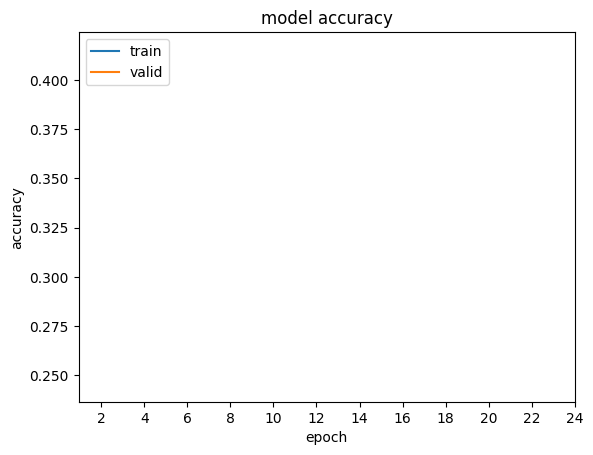

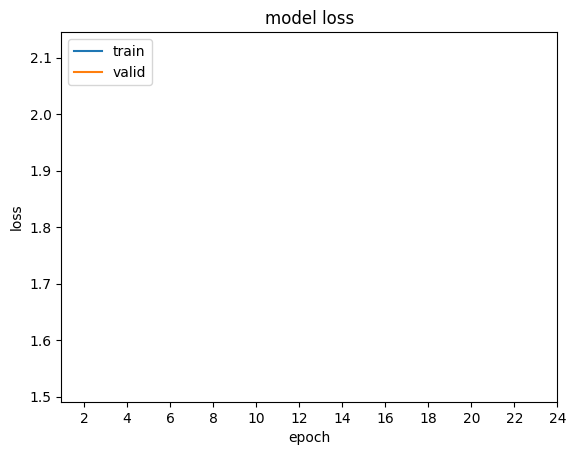

400/400 [==============================] - 7s 16ms/step - loss: 1.5206 - accuracy: 0.4159
Model Accuracy: 0.41585397720336914 and Loss: 1.5205882787704468


 63%|██████▎   | 251/400 [03:06<04:03,  1.63s/it]

In [ ]:
mobilenet = tf.keras.applications.MobileNet(weights='imagenet', include_top=False, input_shape=(224,224,3))
mobilenet = TransferLearning(mobilenet,
                         test_data,
                         test_data,
                         'MobileNet',
                          (224,224),
                          dropout_rate = 0.3,
                          no_layers_trainable = 5)

# VGG

58889256/58889256 [==============================] - 0s 0us/step
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 128)               3211392   
                                                                 
 batch_normalization (Batch  (None, 128)               512       
 Normalization)                                                  
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 64)                82

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


189/189 [==============================] - 71s 297ms/step - loss: 0.5900 - accuracy: 0.7087 - val_loss: 0.3704 - val_accuracy: 0.8448
Epoch 2/25
189/189 [==============================] - ETA: 0s - loss: 0.3761 - accuracy: 0.8351
Epoch 2: val_accuracy improved from 0.84478 to 0.88335, saving model to ./drive/MyDrive/covid_models/VGGNet.h5
189/189 [==============================] - 57s 290ms/step - loss: 0.3761 - accuracy: 0.8351 - val_loss: 0.2927 - val_accuracy: 0.8833
Epoch 3/25
189/189 [==============================] - ETA: 0s - loss: 0.2978 - accuracy: 0.8766
Epoch 3: val_accuracy improved from 0.88335 to 0.90122, saving model to ./drive/MyDrive/covid_models/VGGNet.h5
189/189 [==============================] - 50s 257ms/step - loss: 0.2978 - accuracy: 0.8766 - val_loss: 0.2468 - val_accuracy: 0.9012
Epoch 4/25
189/189 [==============================] - ETA: 0s - loss: 0.2561 - accuracy: 0.8975
Epoch 4: val_accuracy improved from 0.90122 to 0.91533, saving model to ./drive/MyDrive/

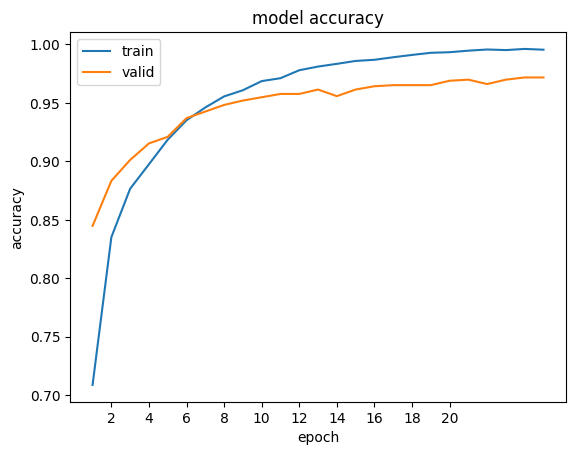

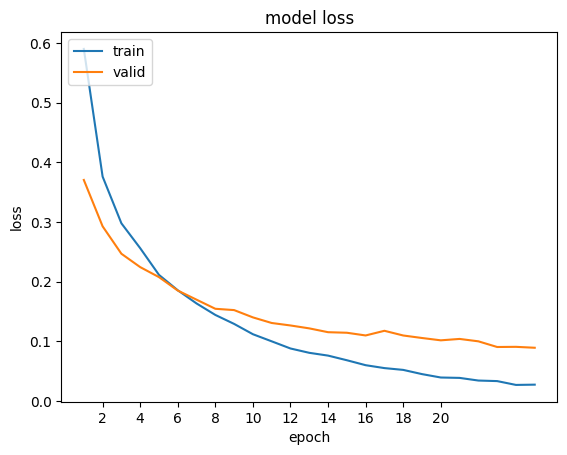

111/111 [==============================] - 25s 209ms/step - loss: 0.0867 - accuracy: 0.9718
Model Accuracy: 0.9718151092529297 and Loss: 0.08667739480733871
Accuracy:  0.971815107102593
Precision:  0.9702247191011236
Recall:  0.9735062006764374
F1 Score:  0.971862689926843
AUC:  0.9718151071025929
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      1774
           1       0.97      0.97      0.97      1774

    accuracy                           0.97      3548
   macro avg       0.97      0.97      0.97      3548
weighted avg       0.97      0.97      0.97      3548



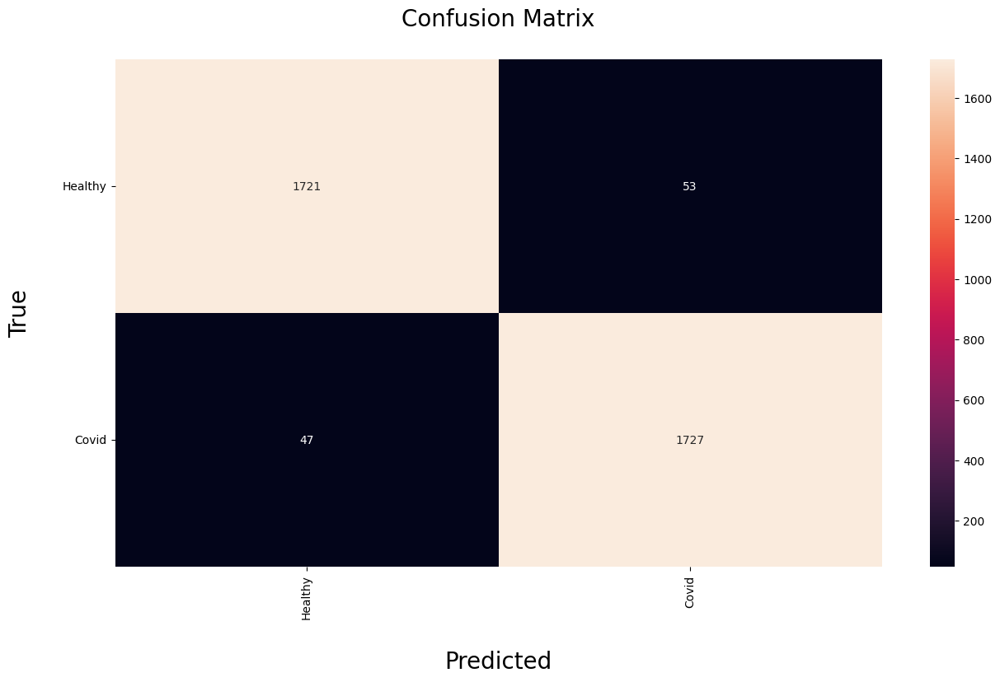

In [ ]:
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False,input_shape=(224,224,3))
model = TransferLearning(model,
                         train_ds,
                         val_ds,
                         'VGGNet',
                          (224,224),
                          trainable = True,
                          hidden_layers = True,
                          num_units = 64,
                          dropout_rate = 0.3,
                          semi_trainable = True,
                          no_layers_trainable = 2)

# ResNet

94765736/94765736 [==============================] - 0s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 flatten_1 (Flatten)         (None, 100352)            0         
                                                                 
 dense_3 (Dense)             (None, 128)               12845184  
                                                                 
 batch_normalization_2 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_4 (Dense)             (None, 64)                

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


189/189 [==============================] - 60s 277ms/step - loss: 0.3921 - accuracy: 0.8179 - val_loss: 0.2467 - val_accuracy: 0.9031
Epoch 2/25
189/189 [==============================] - ETA: 0s - loss: 0.2450 - accuracy: 0.9063
Epoch 2: val_accuracy improved from 0.90310 to 0.93509, saving model to ./drive/MyDrive/covid_models/ResNet.h5
189/189 [==============================] - 54s 278ms/step - loss: 0.2450 - accuracy: 0.9063 - val_loss: 0.1978 - val_accuracy: 0.9351
Epoch 3/25
188/189 [============================>.] - ETA: 0s - loss: 0.1776 - accuracy: 0.9428
Epoch 3: val_accuracy improved from 0.93509 to 0.94638, saving model to ./drive/MyDrive/covid_models/ResNet.h5
189/189 [==============================] - 51s 264ms/step - loss: 0.1775 - accuracy: 0.9428 - val_loss: 0.1601 - val_accuracy: 0.9464
Epoch 4/25
189/189 [==============================] - ETA: 0s - loss: 0.1342 - accuracy: 0.9592
Epoch 4: val_accuracy improved from 0.94638 to 0.95390, saving model to ./drive/MyDrive/

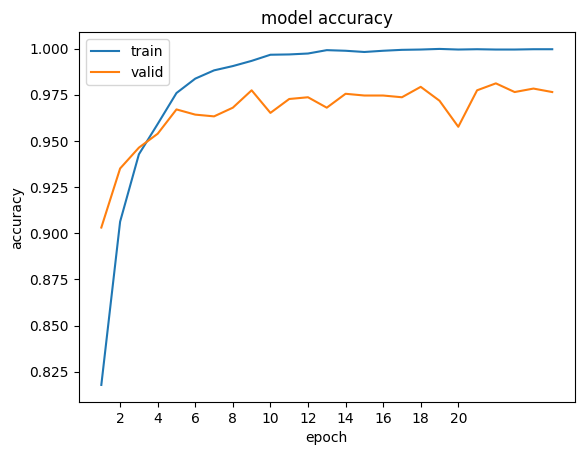

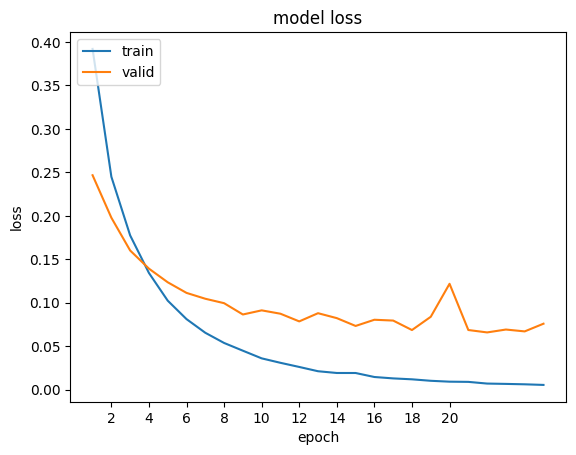

111/111 [==============================] - 23s 193ms/step - loss: 0.0868 - accuracy: 0.9682
Model Accuracy: 0.9681510925292969 and Loss: 0.08682658523321152
Accuracy:  0.9681510710259301
Precision:  0.9775733179988499
Recall:  0.9582863585118376
F1 Score:  0.9678337603188157
AUC:  0.96815107102593
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1774
           1       0.98      0.96      0.97      1774

    accuracy                           0.97      3548
   macro avg       0.97      0.97      0.97      3548
weighted avg       0.97      0.97      0.97      3548



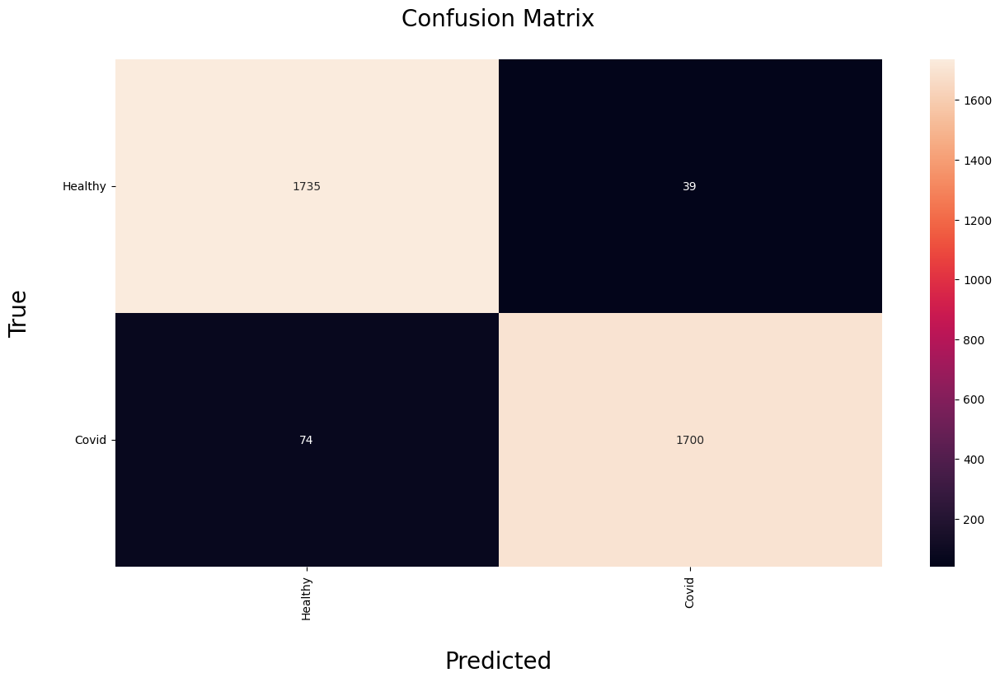

In [ ]:
# ResNet50 model
model = tf.keras.applications.ResNet50(include_top=False, weights='imagenet', input_shape=(224,224,3))
model = TransferLearning(model,
                         train_ds,
                         val_ds,
                         'ResNet',
                          (224,224),
                          trainable = True,
                          hidden_layers = True,
                          num_units = 64,
                          dropout_rate = 0.3,
                          semi_trainable = True,
                          no_layers_trainable = 5)

# DenseNet

29084464/29084464 [==============================] - 0s 0us/step
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 densenet121 (Functional)    (None, 7, 7, 1024)        7037504   
                                                                 
 flatten_2 (Flatten)         (None, 50176)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               6422656   
                                                                 
 batch_normalization_4 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_7 (Dense)             (None, 64)                

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


189/189 [==============================] - 72s 301ms/step - loss: 0.5133 - accuracy: 0.7487 - val_loss: 0.5033 - val_accuracy: 0.7554
Epoch 2/25
189/189 [==============================] - ETA: 0s - loss: 0.3775 - accuracy: 0.8341
Epoch 2: val_accuracy improved from 0.75541 to 0.86642, saving model to ./drive/MyDrive/covid_models/DenseNet.h5
189/189 [==============================] - 50s 258ms/step - loss: 0.3775 - accuracy: 0.8341 - val_loss: 0.3274 - val_accuracy: 0.8664
Epoch 3/25
188/189 [============================>.] - ETA: 0s - loss: 0.3065 - accuracy: 0.8725
Epoch 3: val_accuracy improved from 0.86642 to 0.89464, saving model to ./drive/MyDrive/covid_models/DenseNet.h5
189/189 [==============================] - 51s 263ms/step - loss: 0.3069 - accuracy: 0.8723 - val_loss: 0.2711 - val_accuracy: 0.8946
Epoch 4/25
188/189 [============================>.] - ETA: 0s - loss: 0.2667 - accuracy: 0.8910
Epoch 4: val_accuracy improved from 0.89464 to 0.92098, saving model to ./drive/MyDr

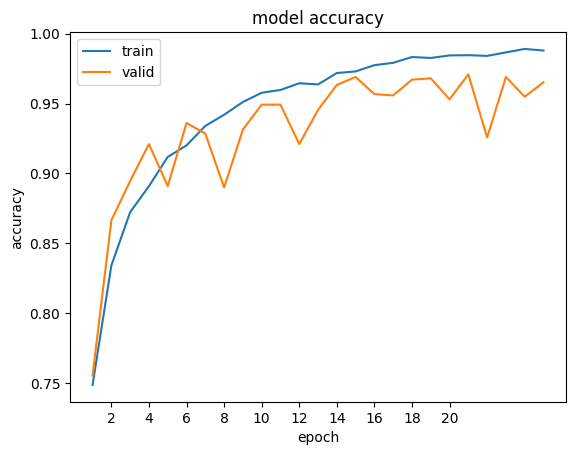

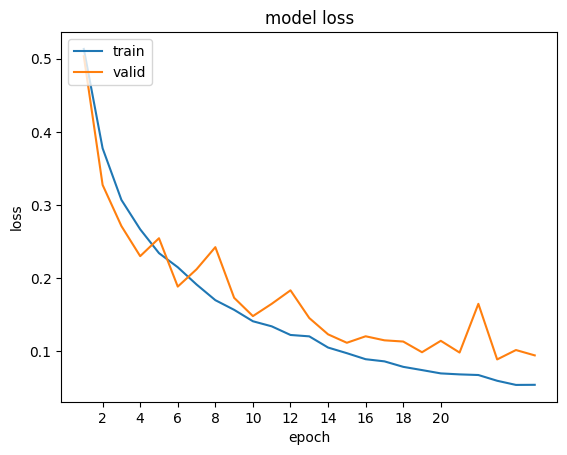

111/111 [==============================] - 25s 203ms/step - loss: 0.1197 - accuracy: 0.9574
Model Accuracy: 0.9574407935142517 and Loss: 0.11968071758747101
Accuracy:  0.9574408117249155
Precision:  0.9655765920826161
Recall:  0.9487034949267192
F1 Score:  0.9570656809781062
AUC:  0.9574408117249154
              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1774
           1       0.97      0.95      0.96      1774

    accuracy                           0.96      3548
   macro avg       0.96      0.96      0.96      3548
weighted avg       0.96      0.96      0.96      3548



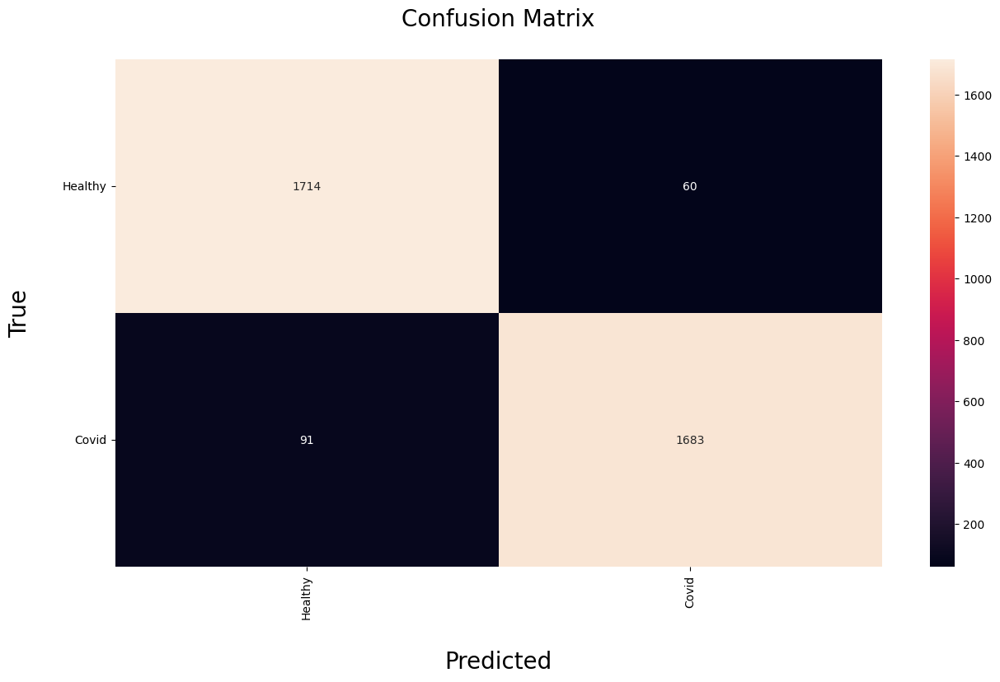

In [ ]:
model = tf.keras.applications.DenseNet121(weights='imagenet', include_top=False,input_shape=(224,224,3))
model = TransferLearning(model,
                         train_ds,
                         val_ds,
                         'DenseNet',
                          (224,224),
                          trainable = True,
                          hidden_layers = True,
                          num_units = 64,
                          dropout_rate = 0.3,
                          semi_trainable = True,
                          no_layers_trainable = 5)

# EfficientNet

214201816/214201816 [==============================] - 1s 0us/step
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnetv2-m (Function  (None, 7, 7, 1280)        53150388  
 al)                                                             
                                                                 
 flatten_3 (Flatten)         (None, 62720)             0         
                                                                 
 dense_9 (Dense)             (None, 128)               8028288   
                                                                 
 batch_normalization_6 (Bat  (None, 128)               512       
 chNormalization)                                                
                                                                 
 dropout_3 (Dropout)         (None, 128)               0         
                                                     

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


189/189 [==============================] - 96s 364ms/step - loss: 0.5081 - accuracy: 0.7504 - val_loss: 0.3716 - val_accuracy: 0.8504
Epoch 2/25
189/189 [==============================] - ETA: 0s - loss: 0.3815 - accuracy: 0.8265
Epoch 2: val_accuracy improved from 0.85042 to 0.85230, saving model to ./drive/MyDrive/covid_models/EfficientNet.h5
189/189 [==============================] - 66s 342ms/step - loss: 0.3815 - accuracy: 0.8265 - val_loss: 0.3315 - val_accuracy: 0.8523
Epoch 3/25
189/189 [==============================] - ETA: 0s - loss: 0.3313 - accuracy: 0.8600
Epoch 3: val_accuracy improved from 0.85230 to 0.89182, saving model to ./drive/MyDrive/covid_models/EfficientNet.h5
189/189 [==============================] - 63s 321ms/step - loss: 0.3313 - accuracy: 0.8600 - val_loss: 0.2599 - val_accuracy: 0.8918
Epoch 4/25
189/189 [==============================] - ETA: 0s - loss: 0.3045 - accuracy: 0.8700
Epoch 4: val_accuracy improved from 0.89182 to 0.90216, saving model to ./dr

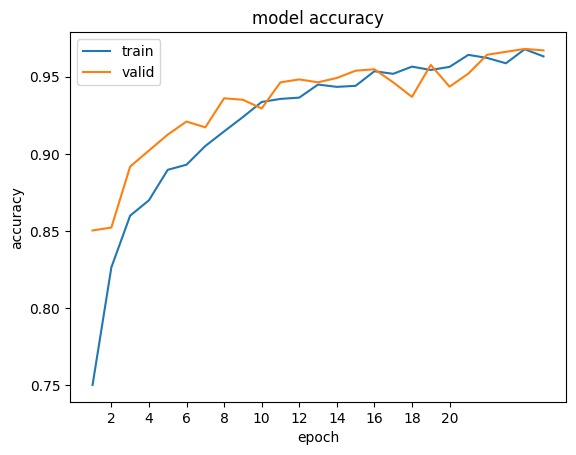

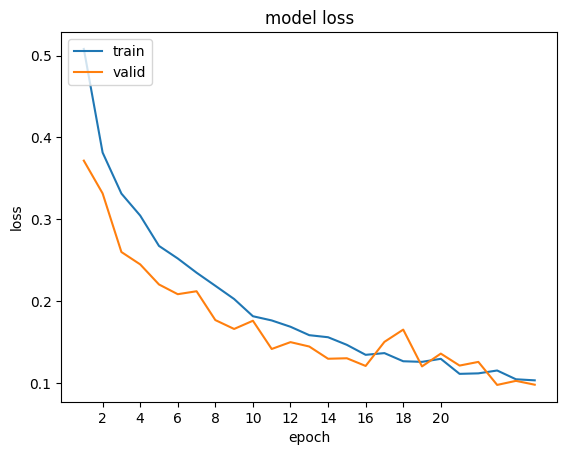

111/111 [==============================] - 30s 256ms/step - loss: 0.1246 - accuracy: 0.9605
Model Accuracy: 0.9605411291122437 and Loss: 0.12456915527582169
Accuracy:  0.9605411499436303
Precision:  0.9493949394939494
Recall:  0.9729425028184893
F1 Score:  0.9610244988864142
AUC:  0.9605411499436303
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      1774
           1       0.95      0.97      0.96      1774

    accuracy                           0.96      3548
   macro avg       0.96      0.96      0.96      3548
weighted avg       0.96      0.96      0.96      3548



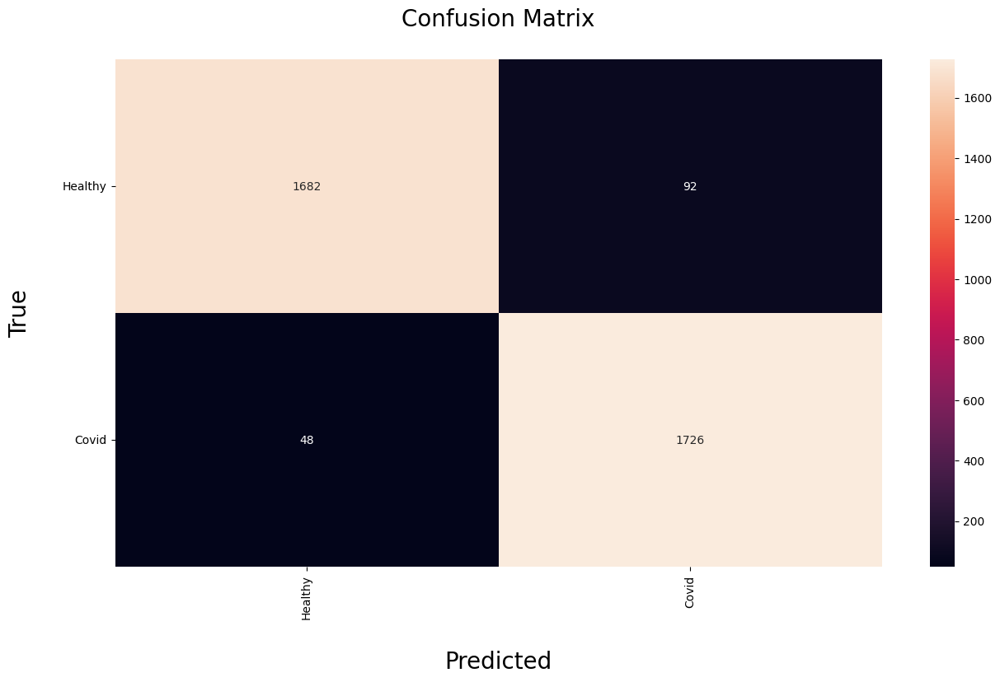

In [ ]:
model = tf.keras.applications.EfficientNetV2M(weights='imagenet', include_top=False,input_shape=(224,224,3))
model = TransferLearning(model,
                         train_ds,
                         val_ds,
                         'EfficientNet',
                          (224,224),
                          trainable = True,
                          hidden_layers = True,
                          num_units = 64,
                          dropout_rate = 0.3,
                          semi_trainable = True,
                          no_layers_trainable = 2)

# InceptionNet

87910968/87910968 [==============================] - 1s 0us/step
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten_4 (Flatten)         (None, 51200)             0         
                                                                 
 dense_12 (Dense)            (None, 128)               6553728   
                                                                 
 batch_normalization_102 (B  (None, 128)               512       
 atchNormalization)                                              
                                                                 
 dropout_4 (Dropout)         (None, 128)               0         
                                                                 
 dense_13 (Dense)            (None, 64)                

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


189/189 [==============================] - 66s 294ms/step - loss: 0.5255 - accuracy: 0.7621 - val_loss: 0.3964 - val_accuracy: 0.8260
Epoch 2/25
188/189 [============================>.] - ETA: 0s - loss: 0.4227 - accuracy: 0.8083
Epoch 2: val_accuracy improved from 0.82596 to 0.83349, saving model to ./drive/MyDrive/covid_models/InceptionNet.h5
189/189 [==============================] - 52s 269ms/step - loss: 0.4229 - accuracy: 0.8081 - val_loss: 0.3679 - val_accuracy: 0.8335
Epoch 3/25
188/189 [============================>.] - ETA: 0s - loss: 0.3656 - accuracy: 0.8373
Epoch 3: val_accuracy improved from 0.83349 to 0.87300, saving model to ./drive/MyDrive/covid_models/InceptionNet.h5
189/189 [==============================] - 50s 259ms/step - loss: 0.3657 - accuracy: 0.8370 - val_loss: 0.3093 - val_accuracy: 0.8730
Epoch 4/25
188/189 [============================>.] - ETA: 0s - loss: 0.3233 - accuracy: 0.8650
Epoch 4: val_accuracy did not improve from 0.87300
189/189 [================

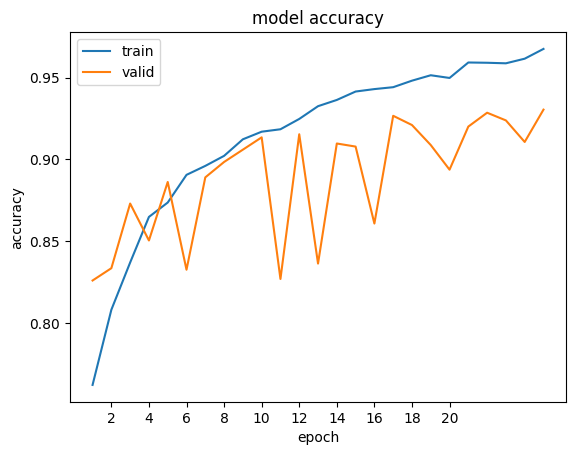

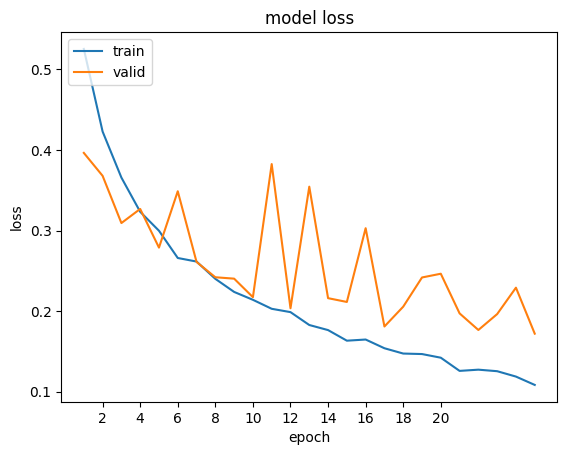

111/111 [==============================] - 24s 202ms/step - loss: 0.1988 - accuracy: 0.9200
Model Accuracy: 0.9199548959732056 and Loss: 0.19875863194465637
Accuracy:  0.9199549041713642
Precision:  0.9266895761741123
Recall:  0.9120631341600902
F1 Score:  0.9193181818181819
AUC:  0.9199549041713642
              precision    recall  f1-score   support

           0       0.91      0.93      0.92      1774
           1       0.93      0.91      0.92      1774

    accuracy                           0.92      3548
   macro avg       0.92      0.92      0.92      3548
weighted avg       0.92      0.92      0.92      3548



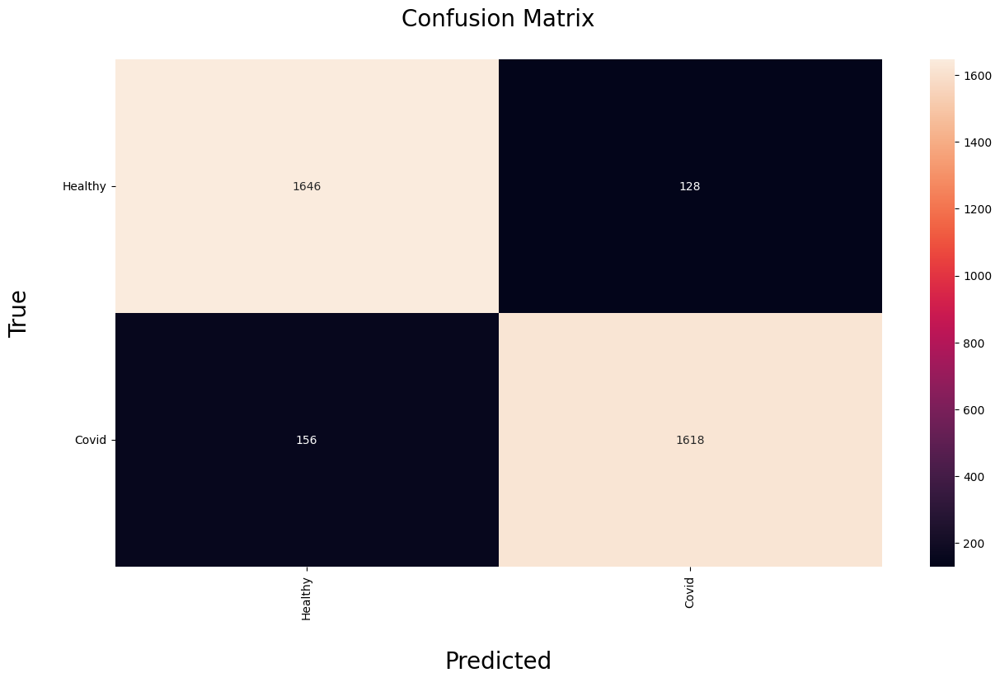

In [ ]:
model = tf.keras.applications.InceptionV3(weights='imagenet', include_top=False,input_shape=(224,224,3))
model = TransferLearning(model,
                         train_ds,
                         val_ds,
                         'InceptionNet',
                          (224,224),
                          trainable = True,
                          hidden_layers = True,
                          num_units = 64,
                          dropout_rate = 0.3,
                          semi_trainable = True,
                          no_layers_trainable = 2)

# Comparison

In [ ]:
import pandas as pd

result = pd.DataFrame(results)
result

,Base,Conv,MobileNet,VGGNet,ResNet,DenseNet,EfficientNet,InceptionNet
Accuracy,0.651071,0.935457,0.927565,0.971815,0.968151,0.957441,0.960541,0.919955
Precision,0.589393,0.971324,0.937176,0.970225,0.977573,0.965577,0.949395,0.926690
Recall,0.996054,0.897407,0.916573,0.973506,0.958286,0.948703,0.972943,0.912063
F1-Score,0.740570,0.932904,0.926760,0.971863,0.967834,0.957066,0.961024,0.919318
AUC,0.651071,0.935457,0.927565,0.971815,0.968151,0.957441,0.960541,0.919955


<Axes: >

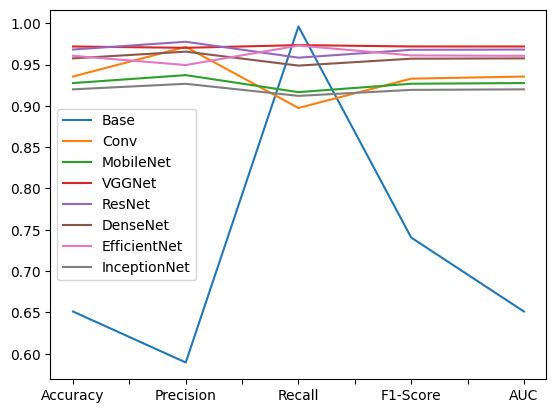

In [ ]:
result.plot()

In [ ]:
import matplotlib.pyplot as plt

Text(0, 0.5, 'Accuracy')

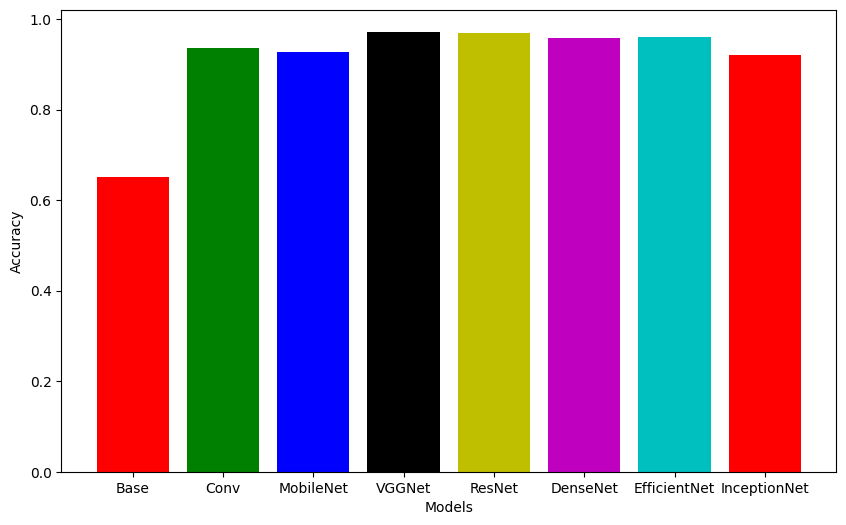

In [ ]:
plt.figure(figsize=(10,6))
my_colors = 'rgbkymc'  #red, green, blue, black, etc.
plt.bar(models,result.T['Accuracy'],color=list(my_colors))
plt.xlabel('Models')
plt.ylabel('Accuracy')

Text(0, 0.5, 'Precision')

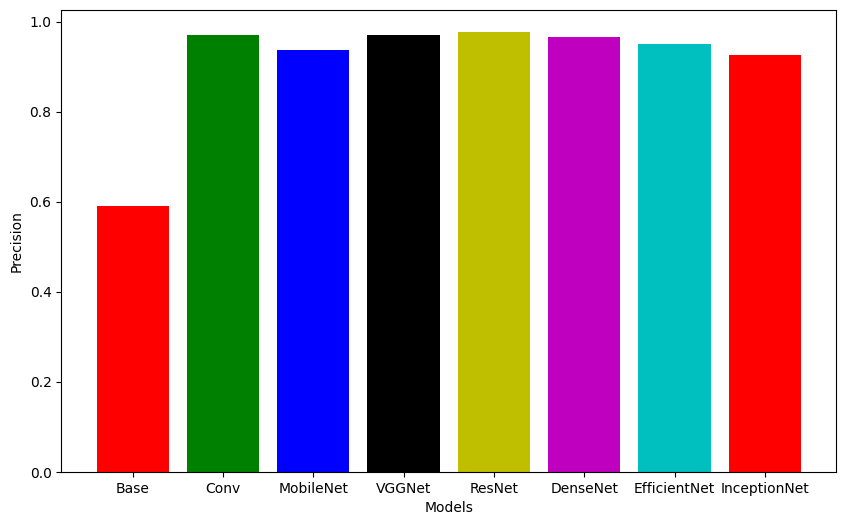

In [ ]:
plt.figure(figsize=(10,6))
plt.bar(models,result.T['Precision'],color=list(my_colors))
plt.xlabel('Models')
plt.ylabel('Precision')

Text(0, 0.5, 'Recall')

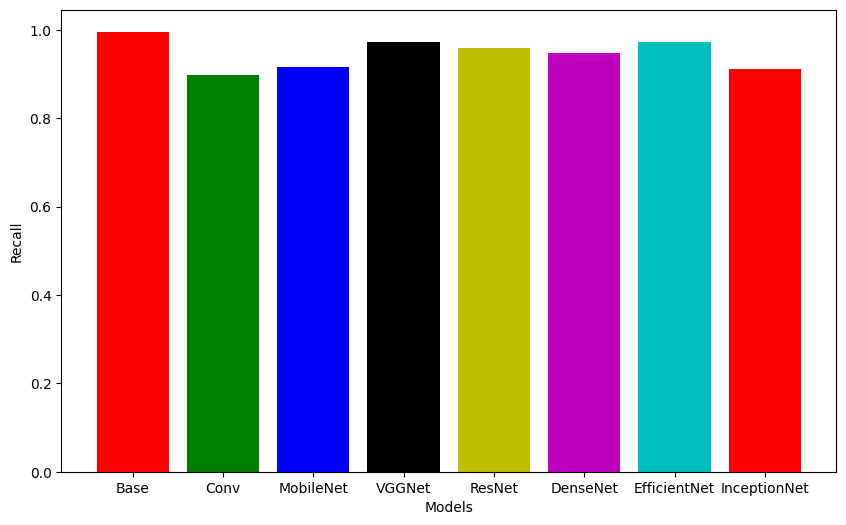

In [ ]:
plt.figure(figsize=(10,6))
plt.bar(models,result.T['Recall'],color=list(my_colors))
plt.xlabel('Models')
plt.ylabel('Recall')

Text(0, 0.5, 'F1-Score')

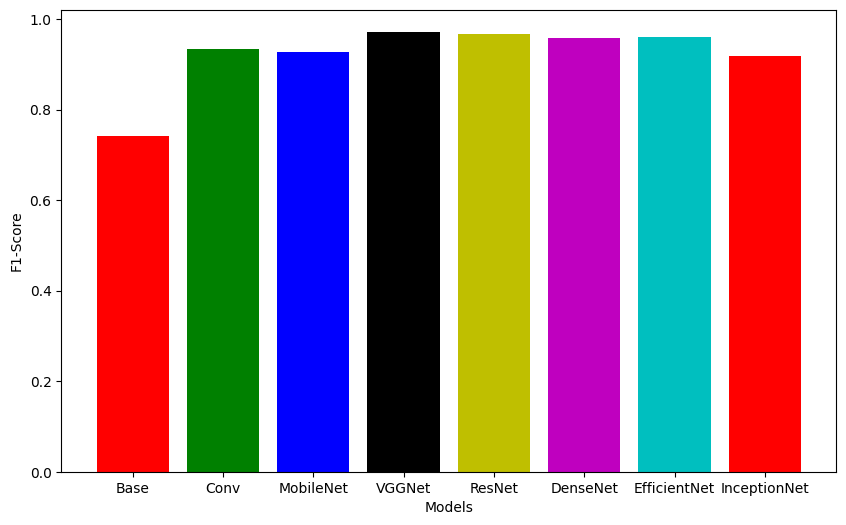

In [ ]:
plt.figure(figsize=(10,6))
plt.bar(models,result.T['F1-Score'],color=list(my_colors))
plt.xlabel('Models')
plt.ylabel('F1-Score')

Text(0, 0.5, 'AUC')

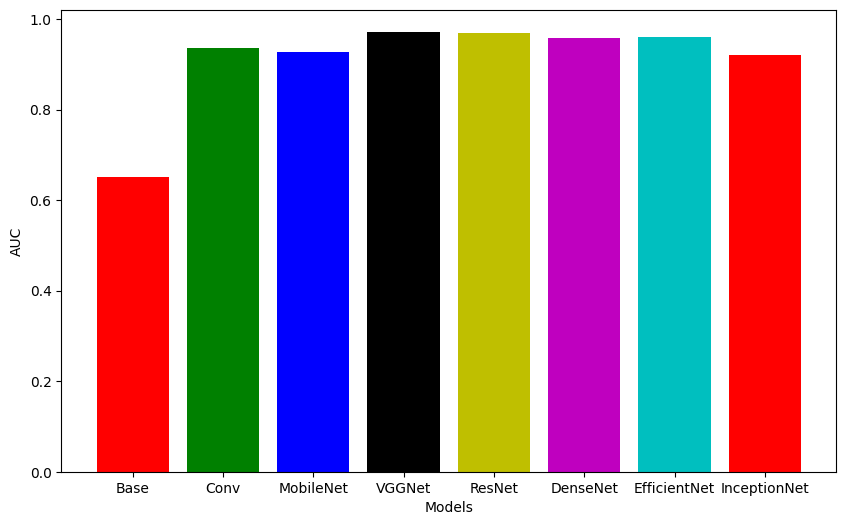

In [ ]:
plt.figure(figsize=(10,6))
plt.bar(models,result.T['AUC'],color=list(my_colors))
plt.xlabel('Models')
plt.ylabel('AUC')

# Load model

In [ ]:
vggnet   = tf.keras.models.load_model('./drive/MyDrive/covid_models/VGGNet.h5')
resnet   = tf.keras.models.load_model('./drive/MyDrive/covid_models/ResNet.h5')
densenet = tf.keras.models.load_model('./drive/MyDrive/covid_models/DenseNet.h5')
effnet   = tf.keras.models.load_model('./drive/MyDrive/covid_models/EfficientNet.h5')

In [ ]:
y_pred1 = []
y_pred2 = []
y_pred3 = []
y_pred4 = []
y_tests = []
X_tests = []
for batch in test_ds.as_numpy_iterator():
        x_test, y_test = batch
        y_test=y_test.reshape((-1,1))
        y_test_pred1 = vggnet.predict(x_test, verbose=0)
        y_test_pred2 = resnet.predict(x_test, verbose=0)
        y_test_pred3 = densenet.predict(x_test, verbose=0)
        y_test_pred4 = effnet.predict(x_test, verbose=0)
        y_tests.extend(y_test)
        y_pred1.extend(y_test_pred1)
        y_pred2.extend(y_test_pred2)
        y_pred3.extend(y_test_pred3)
        y_pred4.extend(y_test_pred4)
        X_tests.extend(x_test)

In [ ]:
y_pred1 = np.array(y_pred1)
y_pred2 = np.array(y_pred2)
y_pred3 = np.array(y_pred3)
y_pred4 = np.array(y_pred4)

In [ ]:
def generate_weights(acc):

    accuracy = np.array(acc)
    weights = np.full((1,len(acc)), 100.0)

    weights = weights - accuracy
    weights = weights**2

    sum = np.sum(weights)
    weights = weights/sum
    weights = 1/weights

    weights = weights**2
    sum = np.sum(weights)

    weights = weights/sum

    return weights

In [ ]:
weights = generate_weights([0.971815,0.968151,0.957441,0.960541])

In [ ]:
y_pred = np.average(a=np.array([y_pred1,y_pred2,y_pred3,y_pred3]),axis=0,weights=weights[0])

In [ ]:
weights

array([[0.250074  , 0.25003699, 0.24992886, 0.24996015]])

In [ ]:
y_pred = tf.where(y_pred < 0.5,0, 1)

Accuracy:  0.9901352874859075
Precision:  0.9887577290612704
Recall:  0.9915445321307779
F1 Score:  0.9901491697157331
AUC:  0.9901352874859075
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      1774
           1       0.99      0.99      0.99      1774

    accuracy                           0.99      3548
   macro avg       0.99      0.99      0.99      3548
weighted avg       0.99      0.99      0.99      3548



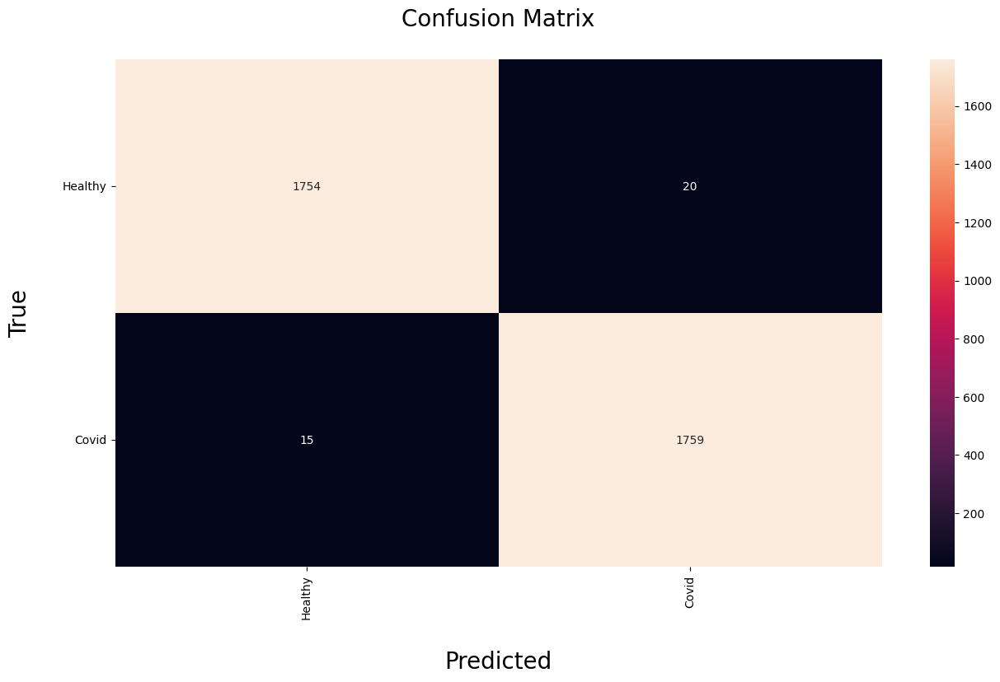

In [ ]:
# calculate model accuracy
fp_rate, tp_rate, thresholds = roc_curve(y_tests, y_pred)
auc_ = auc(fp_rate, tp_rate)
accuracy = accuracy_score(y_tests, y_pred)
precision = precision_score(y_tests, y_pred)
recall = recall_score(y_tests, y_pred)
f1 = f1_score(y_tests, y_pred)
print('Accuracy: ', accuracy)
print('Precision: ', precision)
print('Recall: ', recall)
print('F1 Score: ', f1)
print('AUC: ', auc_)
print(classification_report(y_tests, y_pred))

# Plotting Confusion matrix
cm = confusion_matrix(y_tests, y_pred)
plot_confusion_matrix(cm)

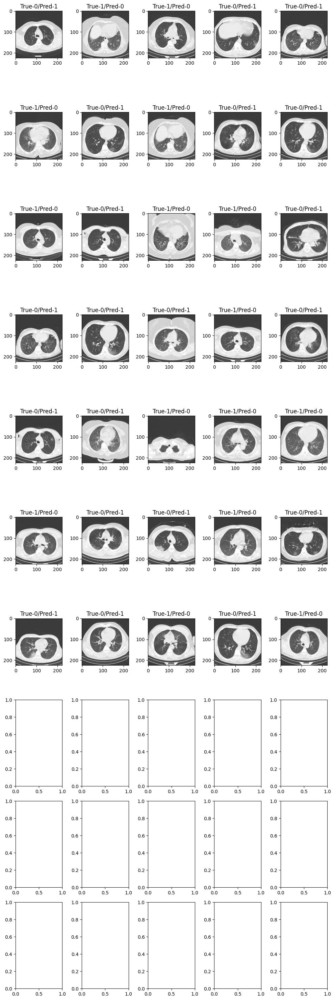

In [ ]:
# plot some samles for false samples
draw_samples(y_tests,y_pred,X_tests,condition=False)

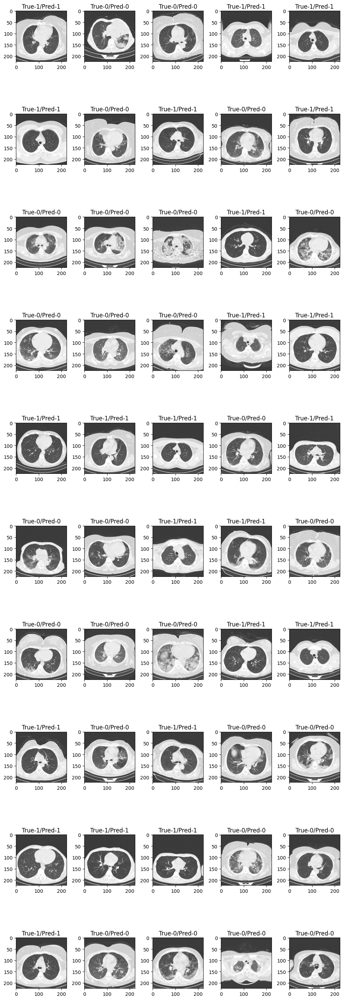

In [ ]:
# plot some samles for true samples
draw_samples(y_tests,y_pred,X_tests,condition=True)

In [ ]:
# Loud ResNet model

resnet50 = 'https://tfhub.dev/google/imagenet/resnet_v2_50/classification/5'  # get structured ResNet model
ResNet = hub.KerasLayer(resnet50, trainable = False) #set ResNet setting

In [ ]:
data = tf.keras.Input(shape=(224,224,3)) # input shape
L1 = ResNet(data) # ResNet laye

L2 = Dense(256, activation='relu')(L1) # Fully conected layer
L2 = Dropout(0.3)(L2) # for reducing overfitting

L3 = Dense(128, activation='relu')(L2) # Fully conected layer
L3 = Dropout(0.3)(L3)

out = Dense(37, activation='softmax')(L3) # Output layer for classification

model = tf.keras.Model(data, out) # build model
LEARNING_RATE = 0.0001
optimizer = tf.keras.optimizers.SGD(learning_rate=LEARNING_RATE)
model.compile(loss = 'categorical_crossentropy', optimizer = optimizer, metrics = ['accuracy']) # config model

model.summary()

# run model
history = model.fit(
    train_data,
    validation_data= val_data,
    epochs=10
)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 keras_layer (KerasLayer)    (None, 1001)              25615849  
                                                                 
 dense (Dense)               (None, 256)               256512    
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_1 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_2 (Dense)             (None, 37)                4773  

# **Findings**

### 1. Train accuracy in the first epoch was significantly lower than val_accuracy—accuracy reported by calculating the average of each batch. Therefore, after 60 batches in the first epoch, the model performed much better with the validation set.

### 2. Overfitting happens because the model memories input data and its label. Hence, the model fails to extract valuable features and classification against unseen data. With dropout, we can reduce the effect and force the model to look for features. The dropout technique randomly removes nodes from architecture.

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


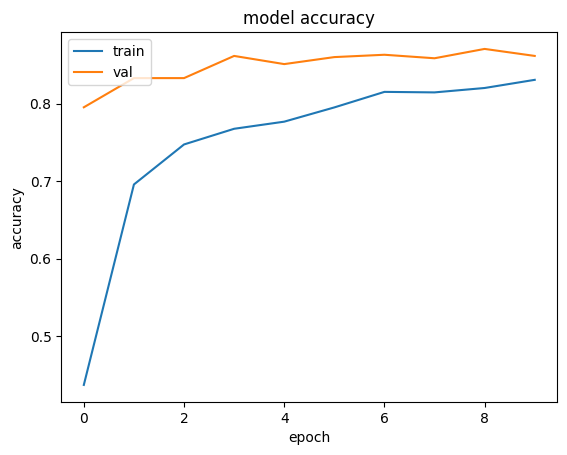

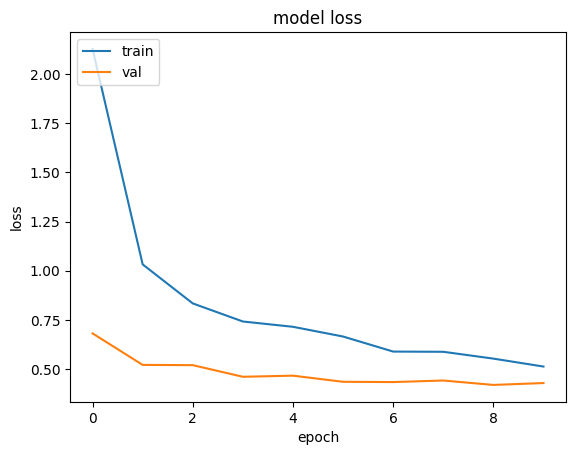

In [ ]:
print(history.history.keys())
# summarize history for accuracy
plt.figure()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
# summarize history for loss
plt.figure()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()


# Evaluation

In [ ]:
# Store the data in X_train, y_train variables by iterating over the batches

import numpy
test_data.reset()
X_test,y_test = next(test_data)
for i in range(0,(numpy.math.ceil(test_data.samples / test_data.batch_size)-1)):
  img, label = next(test_data)
  X_test = np.append(X_test, img, axis=0 )
  y_test = np.append(y_test, label, axis=0)
print(X_test.shape, y_test.shape)



(740, 224, 224, 3) (740, 37)


In [ ]:
# Calculate (Precision,Recall,F1-score) for each category

from sklearn.metrics import confusion_matrix,classification_report
import numpy

test_steps_per_epoch = numpy.math.ceil(test_data.samples / test_data.batch_size)

#predictions = model.predict_generator(validation_generator, steps=test_steps_per_epoch)
predictions = model.predict(X_test)
# Get most likely class
predicted_classes = numpy.argmax(predictions, axis=1)

true_classes = numpy.argmax(y_test, axis=1)
class_labels = list(test_data.class_indices.keys())

report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print(report)

24/24 [==============================] - 2s 82ms/step
                            precision    recall  f1-score   support

                Abyssinian       0.92      0.80      0.86        15
                    Bengal       0.68      1.00      0.81        19
                    Birman       0.78      0.82      0.80        22
                    Bombay       0.81      1.00      0.90        22
         British_Shorthair       0.76      0.73      0.74        22
              Egyptian_Mau       1.00      0.64      0.78        22
                Maine_Coon       0.75      1.00      0.86        12
                   Persian       0.95      0.95      0.95        19
                   Ragdoll       0.74      0.71      0.72        24
              Russian_Blue       0.80      0.64      0.71        25
                   Siamese       1.00      0.92      0.96        26
                    Sphynx       0.82      1.00      0.90        27
          american_bulldog       0.59      0.67      0.62    

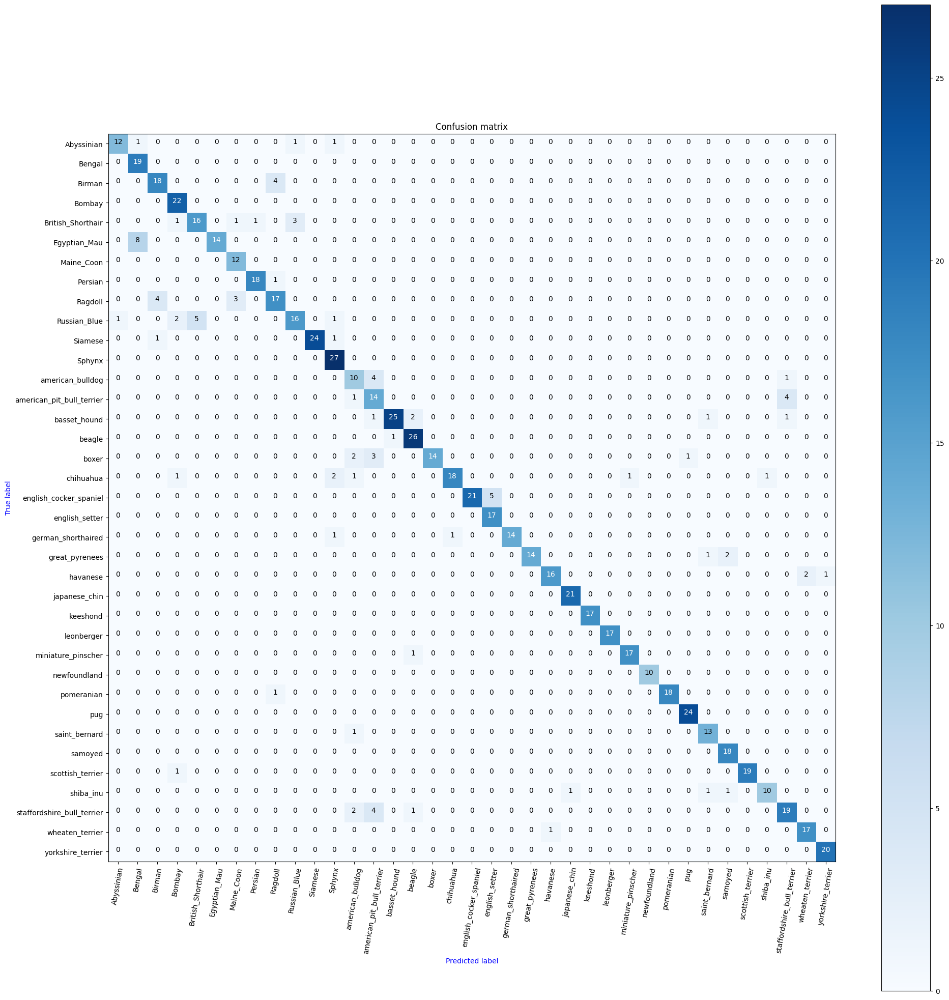

In [ ]:
confusion_mtx = confusion_matrix(true_classes, predicted_classes)



# compute the confusion matrix
import itertools

def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.figure(figsize=(20,20))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=80)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                  horizontalalignment="center",
                  color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label',color='blue')
    plt.xlabel('Predicted label',color='blue')


# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = class_labels, title="Confusion matrix")
